<a href="https://colab.research.google.com/github/dineshssdn-867/2018.fossasia.org/blob/master/Feature_Extraction_with_FFT_and_Fitting_CNN_and_LSTM_DL_models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries

In [1]:
!git clone https://github.com/forrestbao/pyeeg.git
!pip install flaml
!pip install dalex
!pip install shap
!pip install eli5
!pip install focal-loss

Cloning into 'pyeeg'...
remote: Enumerating objects: 210, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 210 (delta 0), reused 0 (delta 0), pack-reused 207
Receiving objects: 100% (210/210), 119.45 KiB | 855.00 KiB/s, done.
Resolving deltas: 100% (95/95), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 199 kB 4.2 MB/s 
     |████████████████████████████████| 2.0 MB 23.6 MB/s 
  Attempting uninstall: lightgbm
    Found existing installation: lightgbm 2.2.3
    Uninstalling lightgbm-2.2.3:
      Successfully uninstalled lightgbm-2.2.3
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 4.1 MB/s 
  Created wheel for dalex: filename=dalex-1.4.1-py3-none-any.whl size=1042860 sha256=35cd6c8167ad78fff9e6a610b5adde118a24bb895338182302627ea5cf4

In [2]:
!pip install attention

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
import numpy as np
import random
from focal_loss import SparseCategoricalFocalLoss
import shap
from pyeeg.pyeeg import spectrum
import pickle as pickle
import pandas as pd
import math
from tensorflow.keras.utils import to_categorical 
from sklearn.ensemble import ExtraTreesClassifier
from tensorflow.keras.models import load_model, Model
from tensorflow.keras import Input

from sklearn import svm
from sklearn.preprocessing import normalize
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import confusion_matrix, classification_report
import os
import tensorflow as tf
import time
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Image
from attention import Attention

In [4]:
import tensorflow as tf
import keras

from tensorflow.keras.utils import to_categorical 

from keras.models import Sequential
from keras.models import load_model

from keras.layers import Conv1D, MaxPooling1D
from keras.layers import BatchNormalization, Activation, Dropout, Flatten, Dense

from keras.regularizers import l2
from keras.layers import Bidirectional
from keras.layers import LSTM, GRU
import dalex as dx

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import confusion_matrix, classification_report

import plotly.express as px
from flaml import AutoML

In [5]:
automl = AutoML()
automl_settings = {
    "time_budget": 600,  # in seconds
    "metric": 'accuracy',
    "task": 'classification'
}

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
channel = [1,2,3,4,6,11,13,17,19,20,21,25,29,31] #14 Channels chosen to fit Emotiv Epoch+
band = [4,7,8,12,13,38,39,42] #7 bands
window_size = 256 #Averaging band power of 2 sec
step_size = 16 #Each 0.125 sec update once
sample_rate = 128 #Sampling rate of 128 Hz
subjectList = ['01','02','03','04','05','06','07','08','09','10','11','12','13','14','15','16','17','18','19','20','21','22','23', '24', '25','26', '27','28','29','30','31','32']
#List of subjects

In [8]:
eeg_ch_names = {0:"Fp1",1:"AF3",2:"F3",3:"F7",4:"FC5",5:"FC1",6:"C3",7:"T7",8:"CP5",9:"CP1",10:"P3",11:"P7",12:"PO3",13:"O1",14:"Oz",15:"Pz",16:"Fp2",17:"AF4",18:"Fz",19:"F4",20:"F8",21:"FC6",22:"FC2",23:"Cz",24:"C4",25:"T8",26:"CP6",27:"CP2",28:"P4",29:"P8",30:"PO4",31:"O2",32:"hEOG",33:"vEOG", 34:"zEMG",35:"tEMG",	36:"GSR",37:"Respiration", 38:"Plethysmograph",39:"Temperature"}

In [9]:
def focal_loss(gamma=2., alpha=4.):

    gamma = float(gamma)
    alpha = float(alpha)

    def focal_loss_fixed(y_true, y_pred):
        """Focal loss for multi-classification
        FL(p_t)=-alpha(1-p_t)^{gamma}ln(p_t)
        Notice: y_pred is probability after softmax
        gradient is d(Fl)/d(p_t) not d(Fl)/d(x) as described in paper
        d(Fl)/d(p_t) * [p_t(1-p_t)] = d(Fl)/d(x)
        Focal Loss for Dense Object Detection
        https://arxiv.org/abs/1708.02002
        Arguments:
            y_true {tensor} -- ground truth labels, shape of [batch_size, num_cls]
            y_pred {tensor} -- model's output, shape of [batch_size, num_cls]
        Keyword Arguments:
            gamma {float} -- (default: {2.0})
            alpha {float} -- (default: {4.0})
        Returns:
            [tensor] -- loss.
        """
        epsilon = 1.e-9
        y_true = tf.convert_to_tensor(y_true, tf.float32)
        y_pred = tf.convert_to_tensor(y_pred, tf.float32)

        model_out = tf.add(y_pred, epsilon)
        ce = tf.multiply(y_true, -tf.math.log(model_out))
        weight = tf.multiply(y_true, tf.pow(tf.subtract(1., model_out), gamma))
        fl = tf.multiply(alpha, tf.multiply(weight, ce))
        reduced_fl = tf.reduce_max(fl, axis=1)
        return tf.reduce_mean(reduced_fl)
    return focal_loss_fixed

In [10]:
def plot_data_four(outputs, classess):
    fig = plt.figure(figsize=(32, 32))
    ax1 = plt.subplot(2,2,1)
    ax1.set_title(classess[0])
    ax1.set_xlabel('time')
    ax1.set_ylabel('Amplitude')
    ax1.plot(x.get("data")[0, outputs[0], :], "r")
    ax2 = plt.subplot(2,2,2)
    ax2.set_title(classess[1])
    ax2.set_xlabel('time')
    ax2.set_ylabel('Amplitude')
    ax2.plot(x.get("data")[0, outputs[1], :], "r")
    ax3 = plt.subplot(2,2,3)
    ax3.set_title(classess[2])
    ax3.set_xlabel('time')
    ax3.set_ylabel('Amplitude')
    ax3.plot(x.get("data")[0, outputs[2], :], "r")
    ax4 = plt.subplot(2,2,4)
    ax4.set_title(classess[3])
    ax4.set_xlabel('time')
    ax4.set_ylabel('Amplitude')
    ax4.plot(x.get("data")[0, outputs[3], :], "r")
    plt.show()

In [11]:
def plot_data_five(outputs, classess, channel_name):
    fig = plt.figure(figsize=(32, 32))
    fig.suptitle(channel_name, fontsize=20)
    ax1 = plt.subplot(3,3,1)
    ax1.set_title(classess[0])
    ax1.set_xlabel('class 4th frequency band')
    ax1.set_ylabel('Amplitude')
    ax1.plot(outputs[0], "r")
    ax2 = plt.subplot(3,3,2)
    ax2.set_title(classess[1])
    ax2.set_xlabel('class 8th frequency band')
    ax2.set_ylabel('Amplitude')
    ax2.plot(outputs[1], "r")
    ax3 = plt.subplot(3,3,3)
    ax3.set_title(classess[2])
    ax3.set_xlabel('class 12th frequency band')
    ax3.set_ylabel('Amplitude')
    ax3.plot(outputs[2], "r")
    ax4 = plt.subplot(3,3,4)
    ax4.set_title(classess[3])
    ax4.set_xlabel('class 16th frequency band')
    ax4.set_ylabel('Amplitude')
    ax4.plot(outputs[3], "r")
    ax5 = plt.subplot(3,3,5)
    ax5.set_title(classess[4])
    ax5.set_xlabel('class 25th frequency band')
    ax5.set_ylabel('Amplitude')
    ax5.plot(outputs[4], "r")
    plt.show()

# Exploratory Data Analysis

--2022-07-10 10:32:09--  https://dl.acm.org/cms/attachment/1e4c7aac-23be-4320-aac7-acf1e1b447dc/image1.jpg
Resolving dl.acm.org (dl.acm.org)... 104.18.16.13, 104.18.17.13
Connecting to dl.acm.org (dl.acm.org)|104.18.16.13|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 61720 (60K) [image/jpeg]
Saving to: ‘image1.jpg’

image1.jpg          100%[===================>]  60.27K  --.-KB/s    in 0.007s  

2022-07-10 10:32:09 (8.98 MB/s) - ‘image1.jpg’ saved [61720/61720]



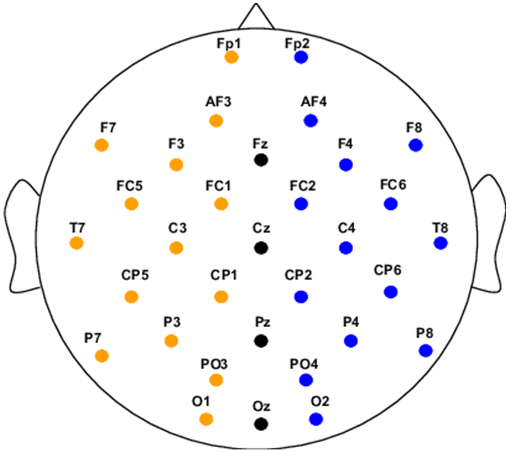

In [ ]:
!wget 'https://dl.acm.org/cms/attachment/1e4c7aac-23be-4320-aac7-acf1e1b447dc/image1.jpg'
Image(filename="/content/image1.jpg")

## Analyze patient 0 for time series data

In [ ]:
file = "/content/drive/MyDrive/Main Akhand Sir UGRP/Main Data/s01.dat" #open one data
with open(file, 'rb') as f:
  x = pickle.load(f, encoding='latin1') #store on variable x

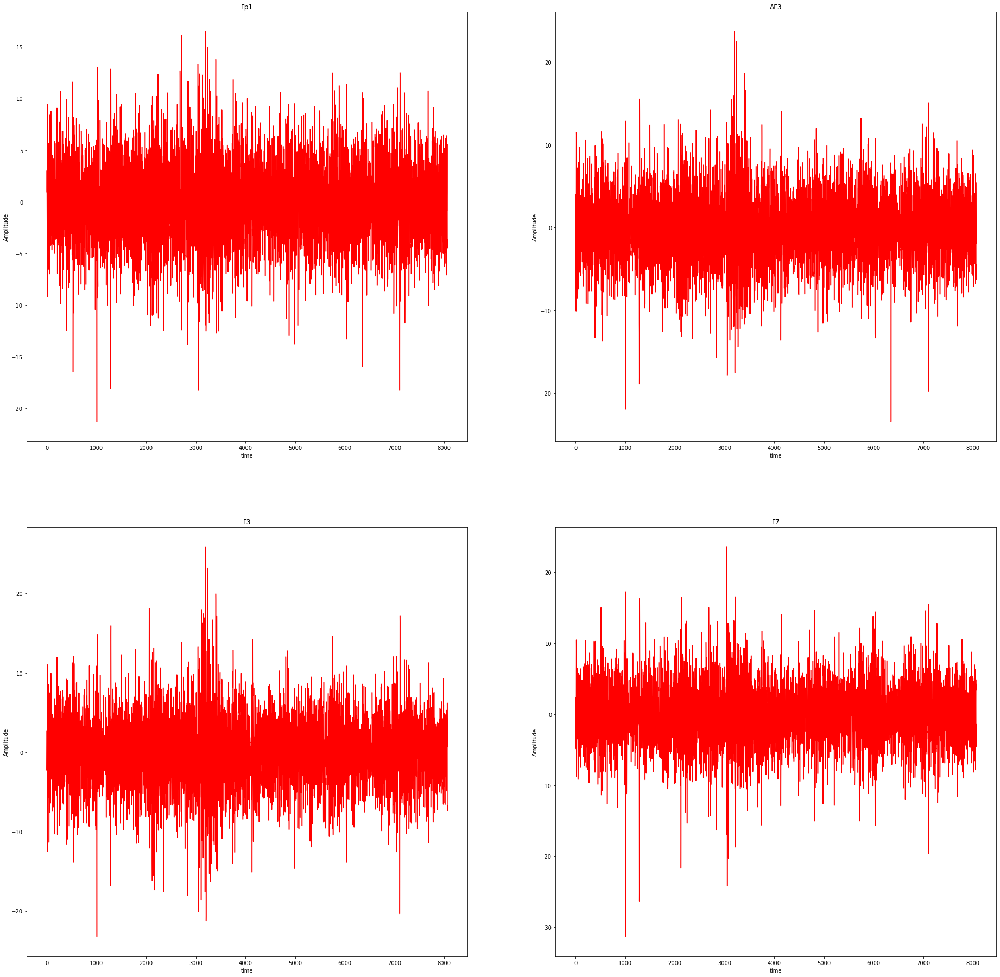

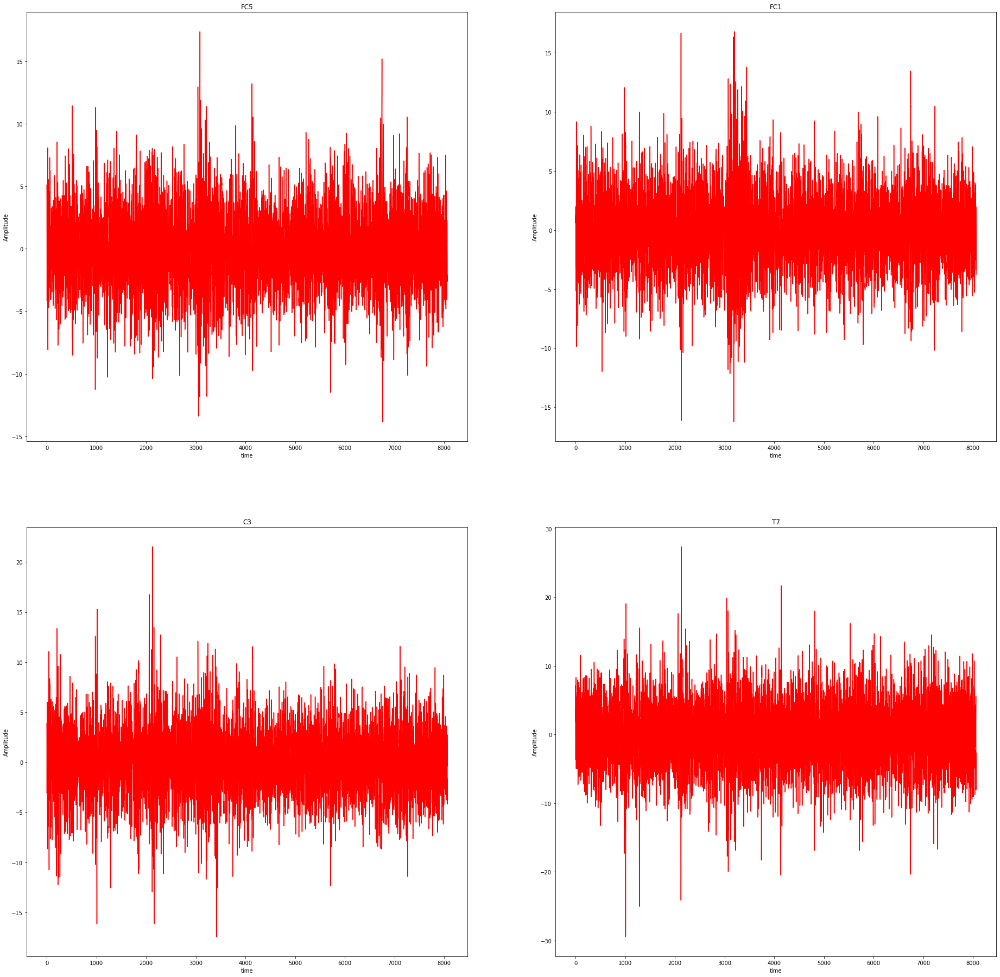

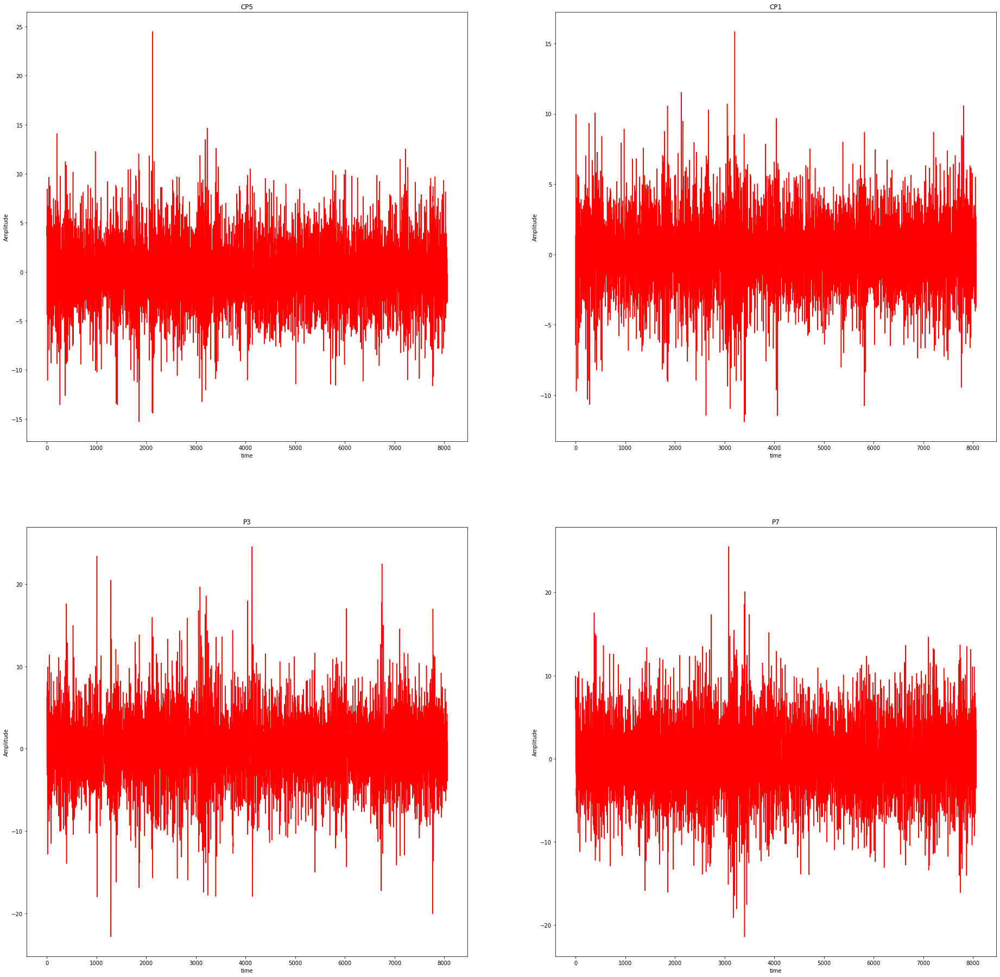

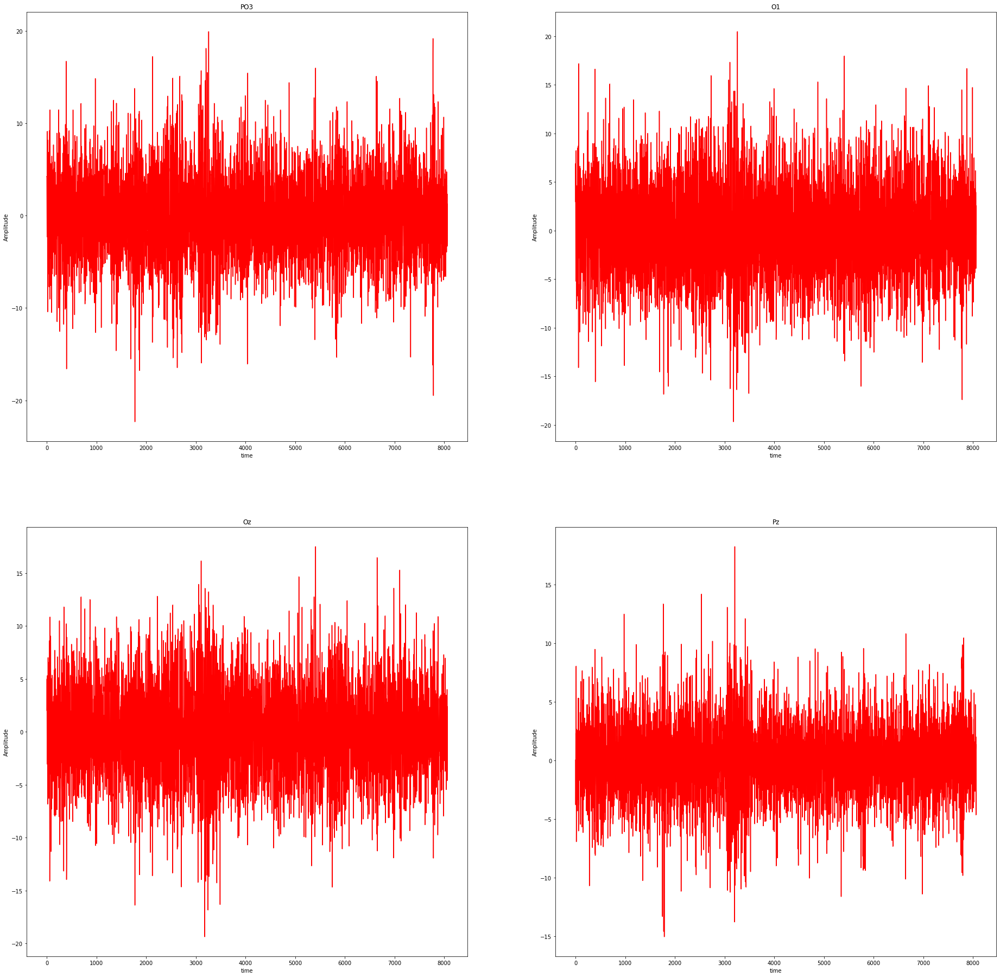

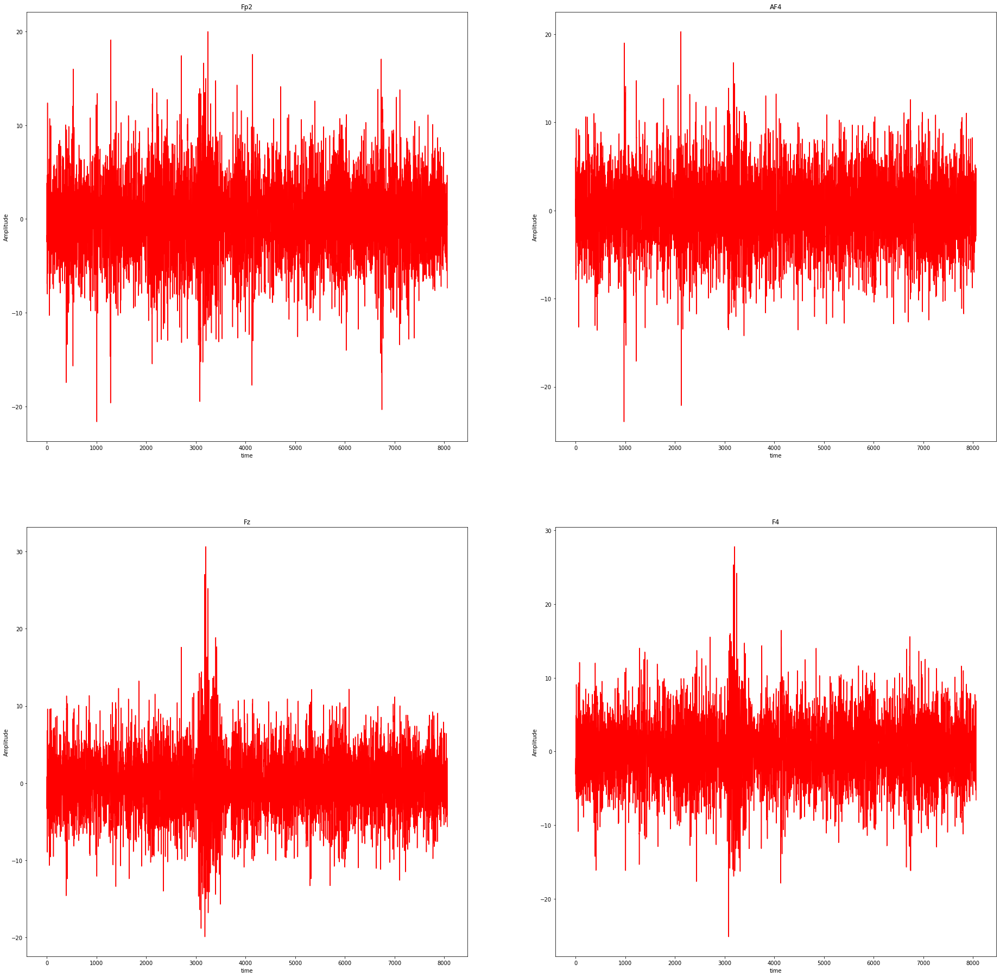

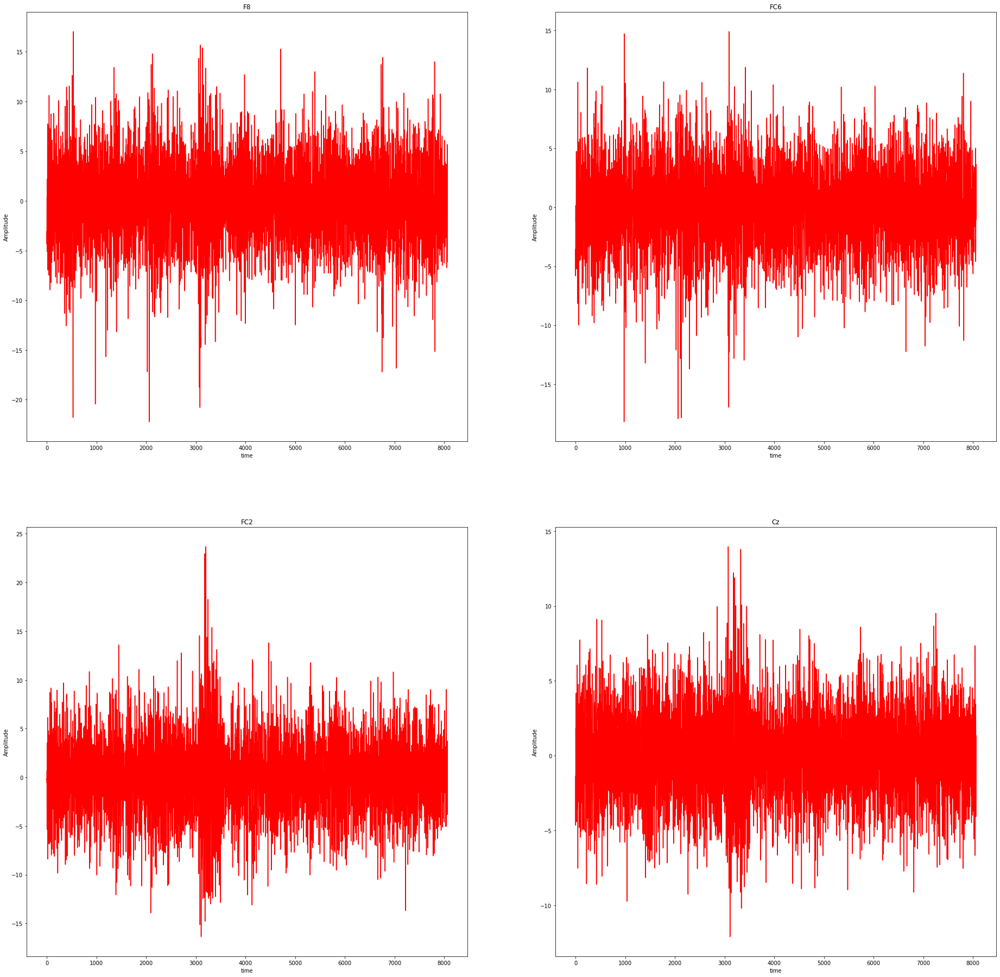

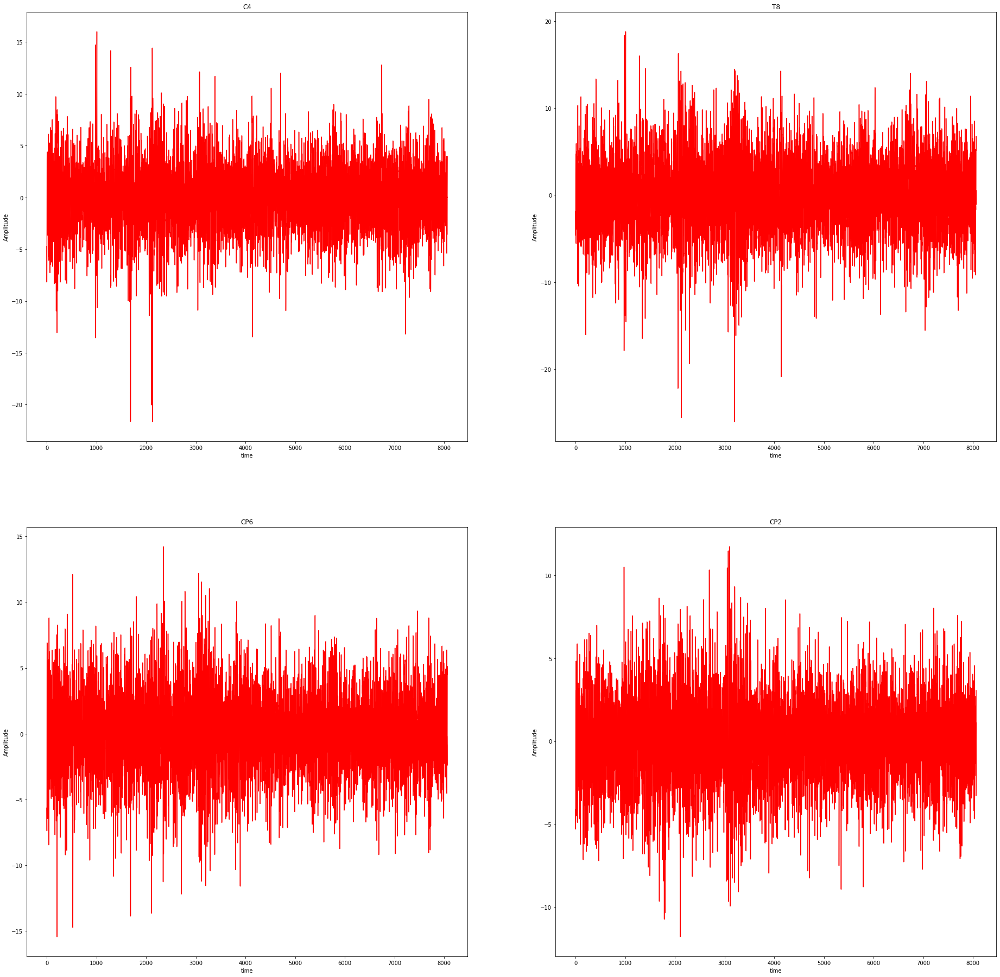

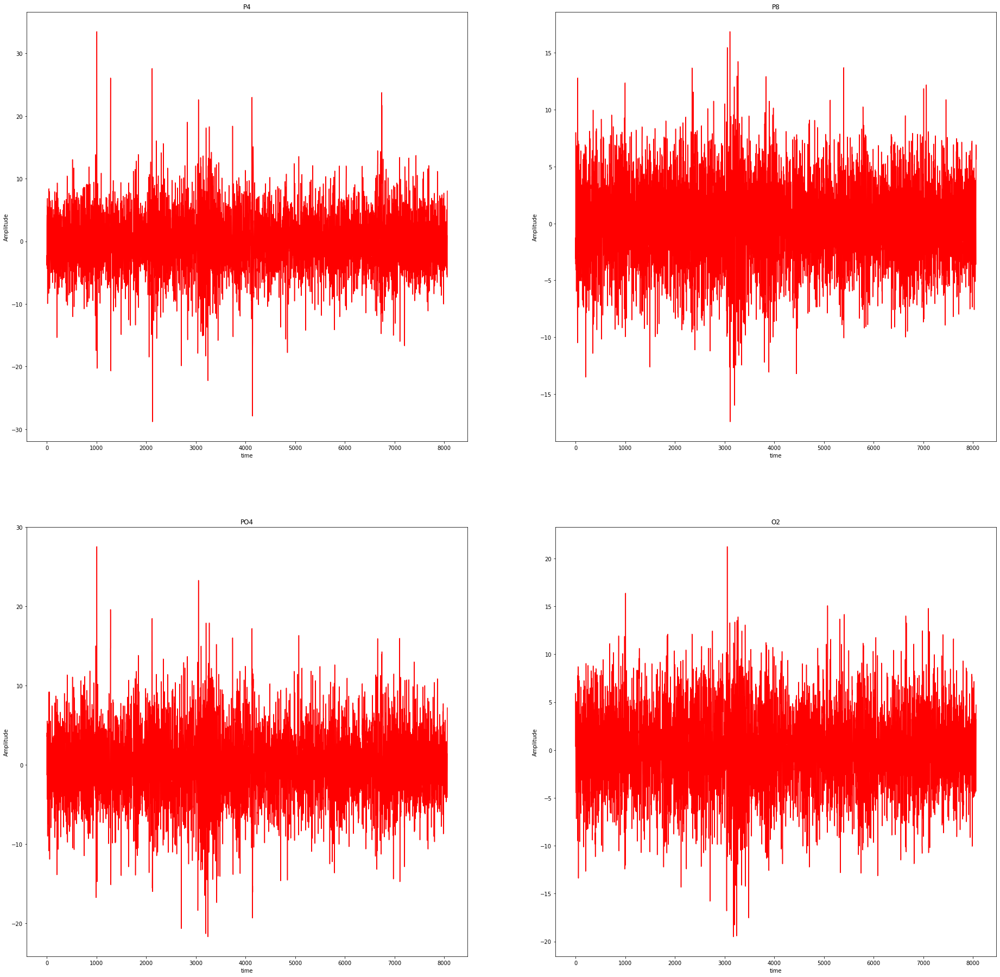

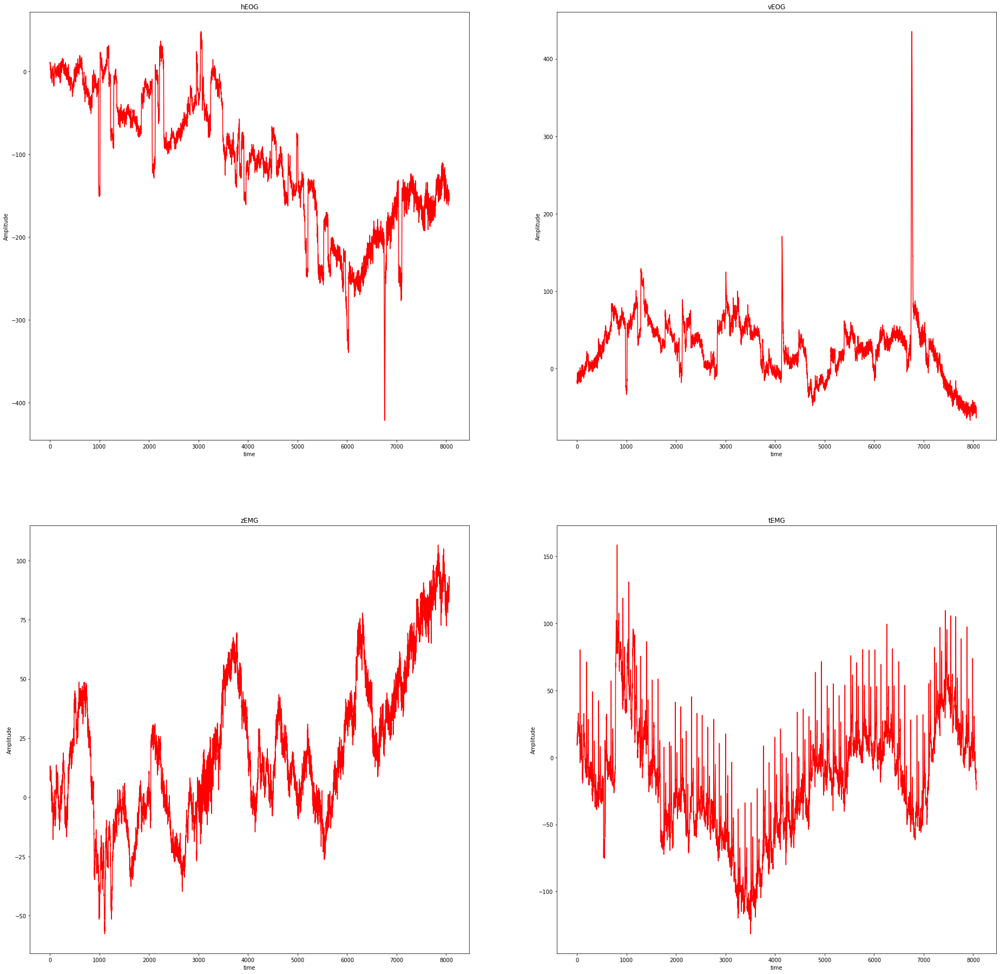

In [ ]:
for i in range(4,40,4):
  plot_data_four(outputs=[i-4, i-3, i-2, i-1], classess=[eeg_ch_names[i-4], eeg_ch_names[i-3], eeg_ch_names[i-2], eeg_ch_names[i-1]])

## Analyze patient 0 for fft data

In [ ]:
file = "/content/drive/MyDrive/Main Akhand Sir UGRP/Pre-processed Data/s01.npy" #open one data
with open(file, 'rb') as f:
  sub = np.load(file,allow_pickle=True)

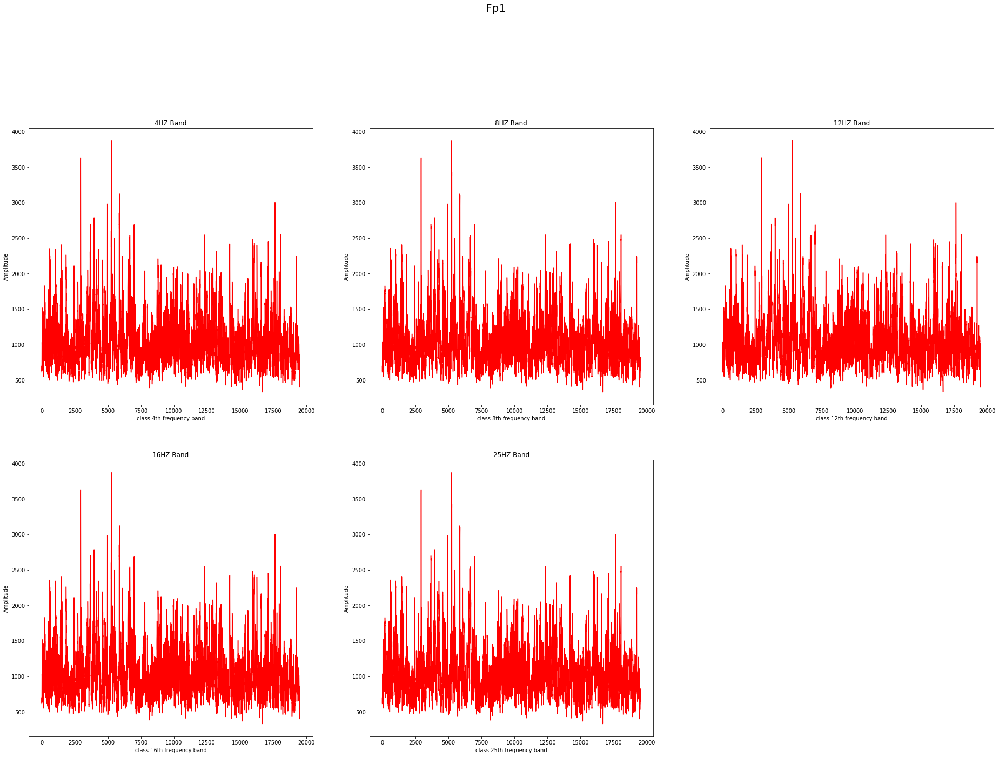

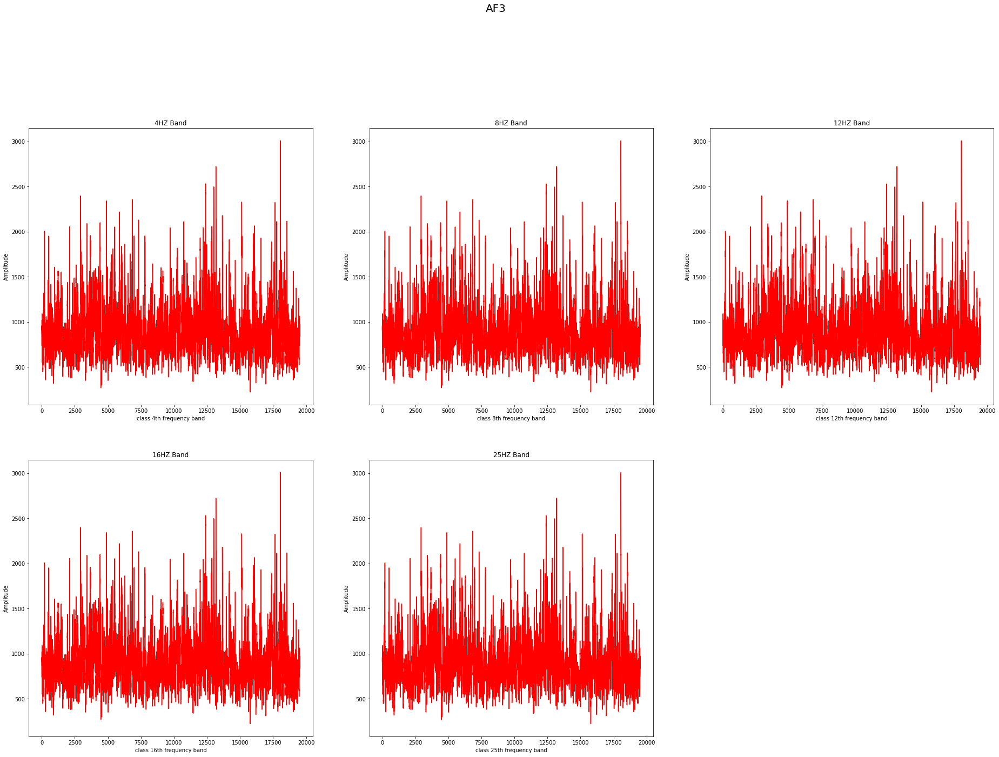

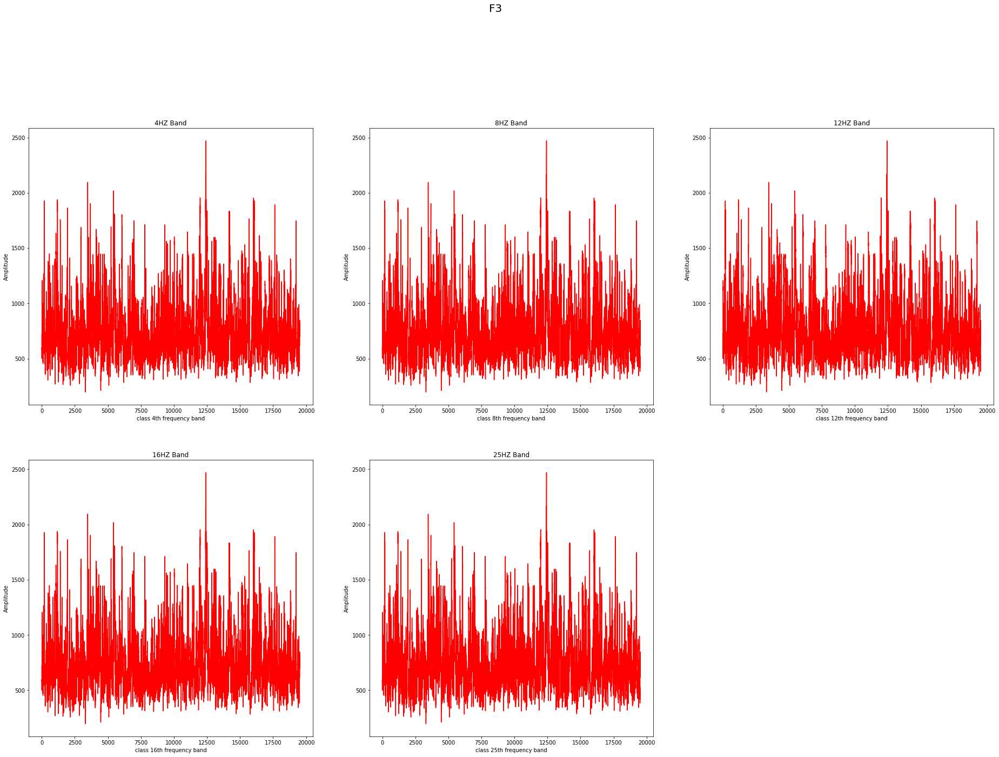

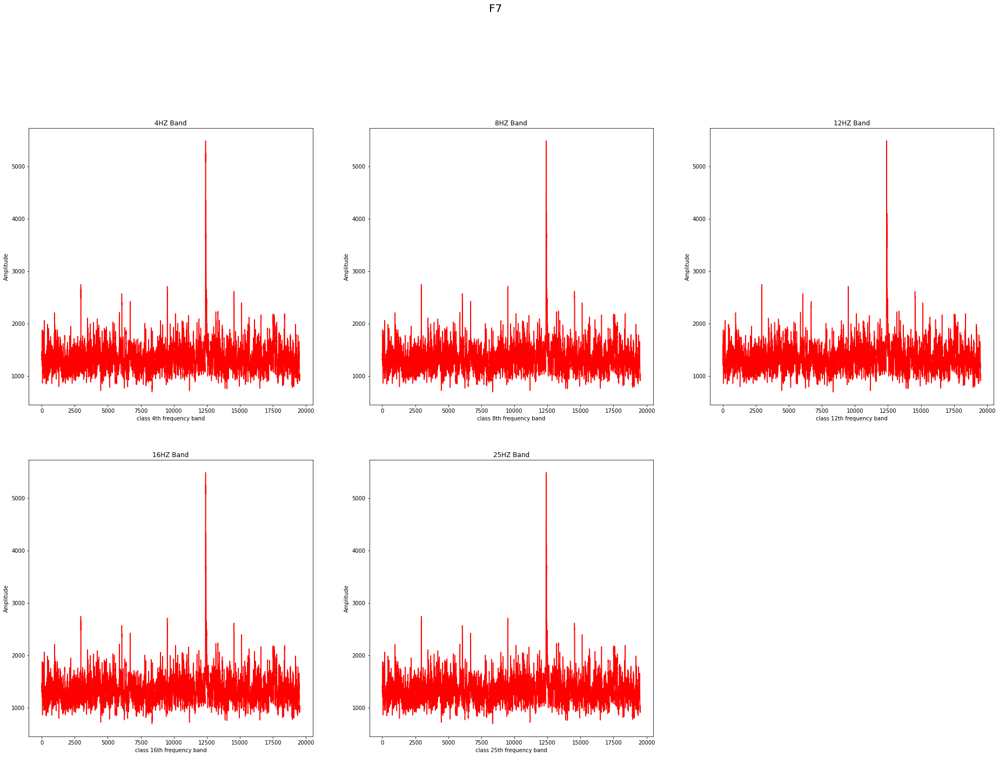

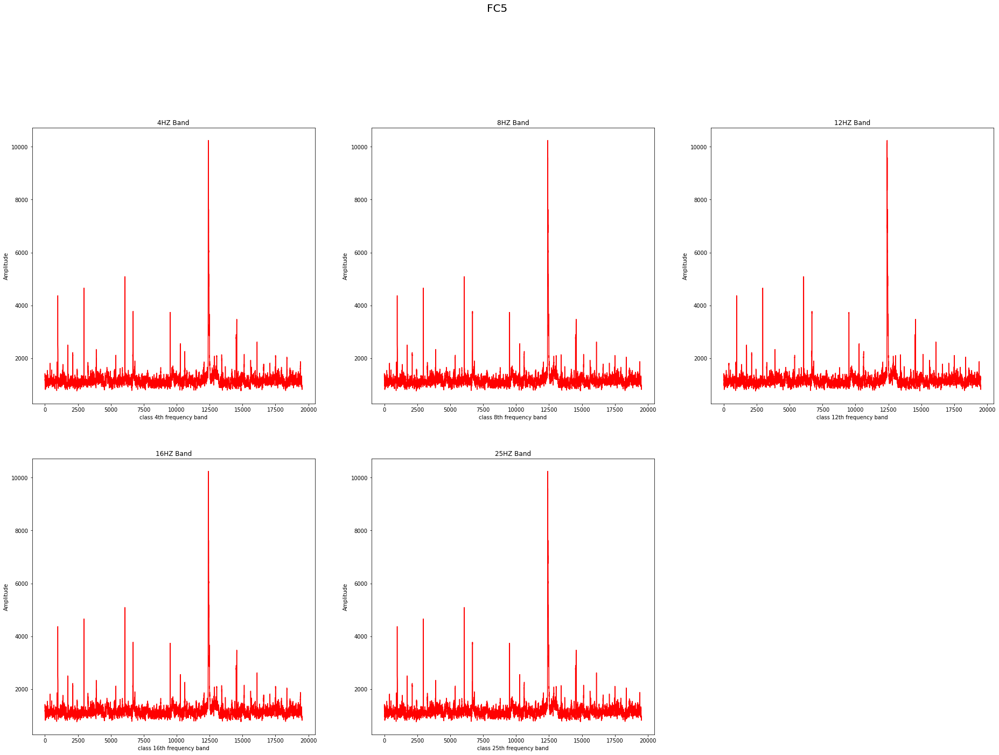

...

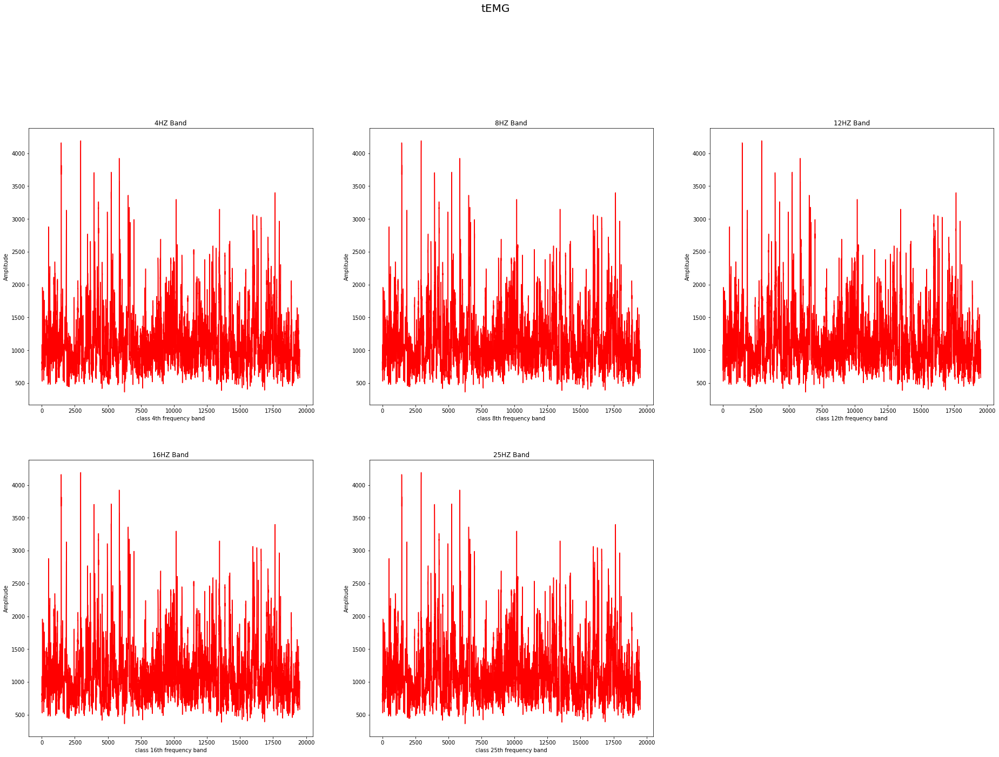

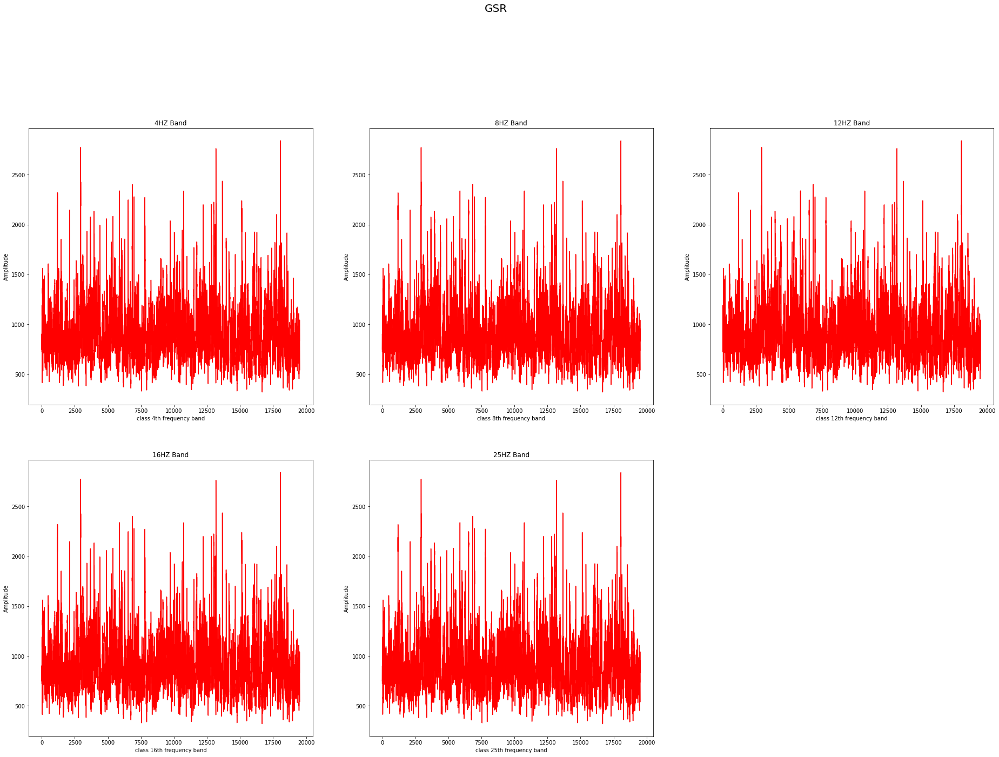

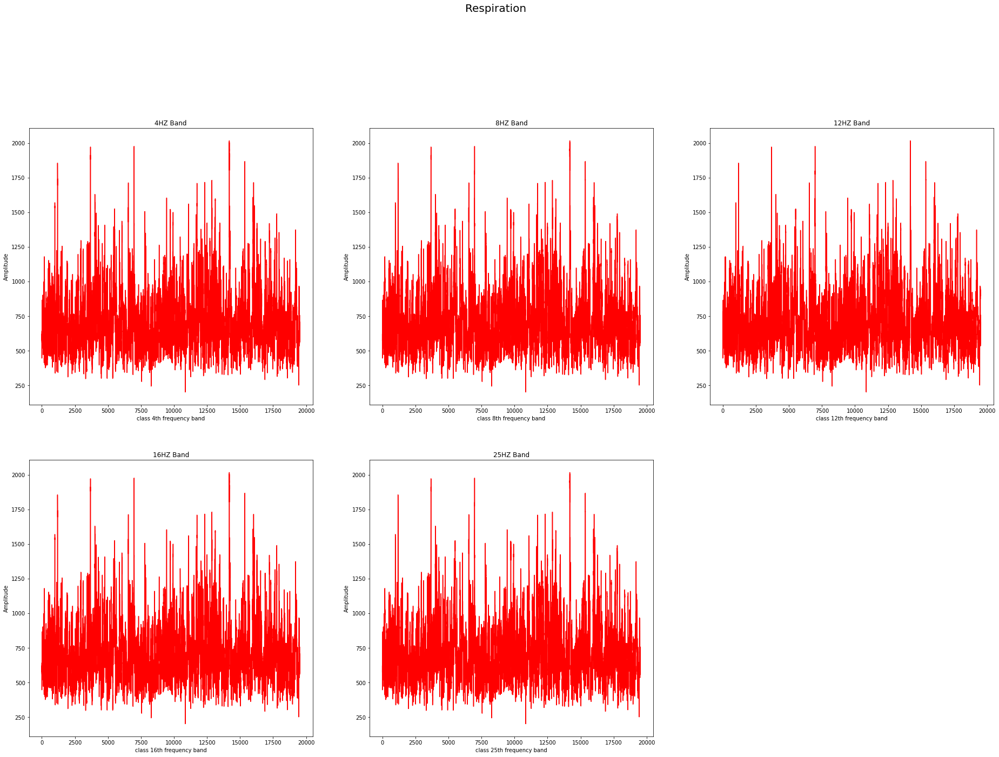

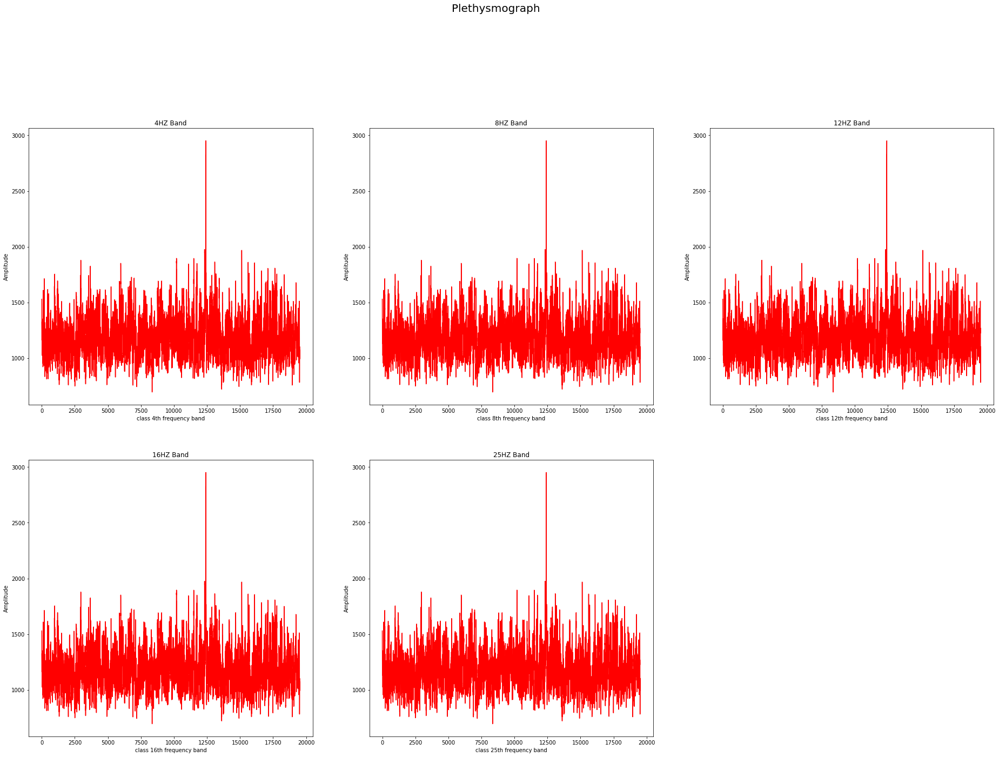

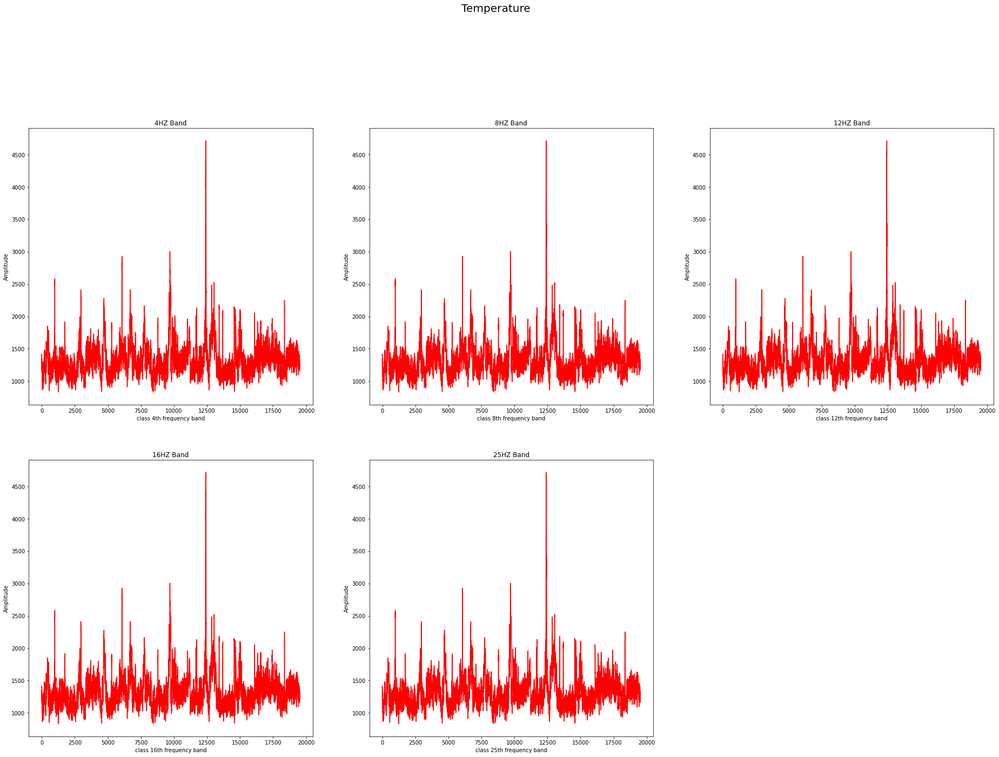

In [ ]:
band_4 = []
band_8 = []
band_12 = []
band_16 = []
band_25 = []

for j in range(0,40):
  band_4 = []
  band_8 = []
  band_12 = []
  band_16 = []
  band_25 = []

  for i in range(0,len(sub)):
    band_4.append(sub[i][0][j])
    band_8.append(sub[i][0][j])
    band_12.append(sub[i][0][j])
    band_16.append(sub[i][0][j])
    band_25.append(sub[i][0][j])
  plot_data_five(outputs=[band_4,band_8,band_12,band_16,band_25], classess=['4HZ Band','8HZ Band','12HZ Band','16HZ Band','25HZ Band'], channel_name=eeg_ch_names[j])

# Datasets Preparation

## Feature Extraction Using FFT

In [ ]:
def label_mapping(valence, arousal):
    # HVHA, HVLA, LVHA, and LVLA
    
    if (valence > 5 and arousal > 5):
        label = 0 #'HVHA'
    elif (valence > 5 and arousal <= 5):
        label = 1 #'HVLA'
    elif (valence <= 5 and arousal > 5):
        label = 2 #'LVHA'
    elif (valence <= 5 and arousal <= 5):
        label = 3 #'LVLA'
    
    return label

In [ ]:
# Mapping only arousal and valence scores
def map_label(label):
    new_label = label_mapping(label[0], label[1]) 
    return new_label

In [ ]:
def FFT_Processing(sub, channel, band, window_size, step_size, sample_rate):
    '''
    arguments:  string subject
                list channel indice
                list band
                int window size for FFT
                int step size for FFT
                int sample rate for FFT
    return:     void
    '''
    meta = []
    with open('/content/drive/MyDrive/Akhand Sir UGRP/Main Data/s' + sub + '.dat', 'rb') as file:

        subject = pickle.load(file, encoding='latin1') #resolve the python 2 data problem by encoding : latin1

        for i in range (0,40):
            # loop over 0-39 trails
            data = subject["data"][i]
            labels = subject["labels"][i]
            labels = np.array(map_label(labels))
            start = 0;

            while start + window_size < data.shape[1]:
                meta_array = []
                meta_data = [] #meta vector for analysis
                for j in channel:
                    X = data[j][start : start + window_size] #Slice raw data over 2 sec, at interval of 0.125 sec
                    Y = spectrum.bin_power(X, band, sample_rate) #FFT over 2 sec of channel j, in seq of theta, alpha, low beta, high beta, gamma
                    meta_data = meta_data + list(Y[0])

                meta_array.append(np.array(meta_data))
                meta_array.append(labels)

                meta.append(np.array(meta_array))  
                start = start + step_size

        meta = np.array(meta)
        np.save('/content/drive/MyDrive/Akhand Sir UGRP/Pre-processed Data/s' + sub, meta, allow_pickle=True, fix_imports=True)

In [ ]:
for subject in subjectList:
    FFT_Processing(subject, channel, band, window_size, step_size, sample_rate)
    print(subject)

In [ ]:
with open('/content/drive/MyDrive/Main Akhand Sir UGRP/Pre-processed Data/s01' + '.npy', 'rb') as file:
    sub = np.load(file,allow_pickle=True)

In [ ]:
print(sub.shape)
print(sub[0].shape)
print(sub[0][0].shape)
print(sub[0][1].shape)

(19520, 2)
(2,)
(98,)
()


## Train and Test and Split

In [12]:
#for subjects in subjectList:
data_training = []
label_training = []
data_testing = []
label_testing = []
data_validation = []
label_validation = []

for subjects in subjectList:
    with open('/content/drive/MyDrive/Main Akhand Sir UGRP/Pre-processed Data/s' + subjects + '.npy', 'rb') as file:
        sub = np.load(file,allow_pickle=True)
        for i in range (0,sub.shape[0]):
            if i % 10 == 0:
                data_testing.append(sub[i][0])
                label_testing.append(sub[i][1])
            elif i % 10 == 1:
                data_validation.append(sub[i][0])
                label_validation.append(sub[i][1])
            else:
                data_training.append(sub[i][0])
                label_training.append(sub[i][1])

np.save('/content/drive/MyDrive/Main Akhand Sir UGRP/Data for traning and testing/train_data', np.array(data_training), allow_pickle=True, fix_imports=True)
np.save('/content/drive/MyDrive/Main Akhand Sir UGRP/Labels/train_labels', np.array(label_training), allow_pickle=True, fix_imports=True)
print("training dataset:", np.array(data_training).shape, np.array(label_training).shape)

np.save('/content/drive/MyDrive/Main Akhand Sir UGRP/Data for traning and testing/test_data', np.array(data_testing), allow_pickle=True, fix_imports=True)
np.save('/content/drive/MyDrive/Main Akhand Sir UGRP/Labels/test_labels', np.array(label_testing), allow_pickle=True, fix_imports=True)
print("testing dataset:", np.array(data_testing).shape, np.array(label_testing).shape)

np.save('/content/drive/MyDrive/Main Akhand Sir UGRP/Data for traning and testing/val_data', np.array(data_validation), allow_pickle=True, fix_imports=True)
np.save('/content/drive/MyDrive/Main Akhand Sir UGRP/Labels/val_labels', np.array(label_validation), allow_pickle=True, fix_imports=True)
print("validation dataset:", np.array(data_validation).shape, np.array(label_validation).shape)

training dataset: (499712, 98) (499712,)
testing dataset: (62464, 98) (62464,)
validation dataset: (62464, 98) (62464,)


In [13]:
unique, counts = np.unique(label_training, return_counts=True)
label_dist = dict(zip(unique, counts))
print(label_dist)
unique, counts = np.unique(label_validation, return_counts=True)
label_dist = dict(zip(unique, counts))
print(label_dist)
unique, counts = np.unique(label_testing, return_counts=True)
label_dist = dict(zip(unique, counts))
print(label_dist)

{0: 171372, 1: 105004, 2: 116368, 3: 106968}
{0: 21430, 1: 13134, 2: 14528, 3: 13372}
{0: 21430, 1: 13134, 2: 14528, 3: 13372}


In [14]:
data_train = np.array(data_training)
label_train = np.array(label_training)
data_val = np.array(data_validation)
label_val = np.array(label_validation)
data_test = np.array(data_testing)
label_test = np.array(label_testing)

## Pre-process

In [16]:
scaler = StandardScaler()

In [17]:
# 4 Normalization -> Standardization 
x_train = scaler.fit_transform(data_train)
x_val = scaler.fit_transform(data_val)
x_test = scaler.fit_transform(data_test)

In [18]:
X_train = x_train.reshape(x_train.shape[0],x_train.shape[1], 1)
X_val = x_val.reshape(x_val.shape[0],x_val.shape[1],1)
X_test = x_test.reshape(x_test.shape[0],x_test.shape[1],1)

In [19]:
y_train = to_categorical(label_train)
y_val = to_categorical(label_val)
y_test = to_categorical(label_test)

# Custom Callback

In [20]:
def print_in_color(txt_msg,fore_tupple,back_tupple,):
    #prints the text_msg in the foreground color specified by fore_tupple with the background specified by back_tupple 
    #text_msg is the text, fore_tupple is foregroud color tupple (r,g,b), back_tupple is background tupple (r,g,b)
    rf,gf,bf=fore_tupple
    rb,gb,bb=back_tupple
    msg='{0}' + txt_msg
    mat='\33[38;2;' + str(rf) +';' + str(gf) + ';' + str(bf) + ';48;2;' + str(rb) + ';' +str(gb) + ';' + str(bb) +'m' 
    print(msg .format(mat), flush=True)
    print('\33[0m', flush=True) # returns default print color to back to black
    return

In [21]:
class LRA(keras.callbacks.Callback):
    def __init__(self,model, base_model, patience,stop_patience, threshold, factor, dwell, batches, initial_epoch,epochs, ask_epoch):
        super(LRA, self).__init__()
        self.model=model
        self.base_model=base_model
        self.patience=patience # specifies how many epochs without improvement before learning rate is adjusted
        self.stop_patience=stop_patience # specifies how many times to adjust lr without improvement to stop training
        self.threshold=threshold # specifies training accuracy threshold when lr will be adjusted based on validation loss
        self.factor=factor # factor by which to reduce the learning rate
        self.dwell=dwell
        self.batches=batches # number of training batch to runn per epoch
        self.initial_epoch=initial_epoch
        self.epochs=epochs
        self.ask_epoch=ask_epoch
        self.ask_epoch_initial=ask_epoch # save this value to restore if restarting training
        # callback variables 
        self.count=0 # how many times lr has been reduced without improvement
        self.stop_count=0        
        self.best_epoch=1   # epoch with the lowest loss        
        self.initial_lr=float(tf.keras.backend.get_value(model.optimizer.lr)) # get the initiallearning rate and save it         
        self.highest_tracc=0.0 # set highest training accuracy to 0 initially
        self.lowest_vloss=np.inf # set lowest validation loss to infinity initially
        self.best_weights=self.model.get_weights() # set best weights to model's initial weights
        self.initial_weights=self.model.get_weights()   # save initial weights if they have to get restored 
        
    def on_train_begin(self, logs=None):        
        if self.base_model != None:
            status=base_model.trainable
            if status:
                msg=' initializing callback starting train with base_model trainable'
            else:
                msg='initializing callback starting training with base_model not trainable'
        else:
            msg='initialing callback and starting training'                        
        print_in_color (msg, (244, 252, 3), (55,65,80)) 
        msg='{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^9s}{6:^9s}{7:^10s}{8:10s}{9:^8s}'.format('Epoch', 'Loss', 'Accuracy',
                                                                                              'V_loss','V_acc', 'LR', 'Next LR', 'Monitor','% Improv', 'Duration')
        print_in_color(msg, (244,252,3), (55,65,80)) 
        self.start_time= time.time()
        
    def on_train_end(self, logs=None):
        stop_time=time.time()
        tr_duration= stop_time- self.start_time            
        hours = tr_duration // 3600
        minutes = (tr_duration - (hours * 3600)) // 60
        seconds = tr_duration - ((hours * 3600) + (minutes * 60))

        self.model.set_weights(self.best_weights) # set the weights of the model to the best weights
        msg=f'Training is completed - model is set with weights from epoch {self.best_epoch} '
        print_in_color(msg, (0,255,0), (55,65,80))
        msg = f'training elapsed time was {str(hours)} hours, {minutes:4.1f} minutes, {seconds:4.2f} seconds)'
        print_in_color(msg, (0,255,0), (55,65,80))   
        
    def on_train_batch_end(self, batch, logs=None):
        acc=logs.get('accuracy')* 100  # get training accuracy 
        loss=logs.get('loss')
        msg='{0:20s}processing batch {1:4s} of {2:5s} accuracy= {3:8.3f}  loss: {4:8.5f}'.format(' ', str(batch), str(self.batches), acc, loss)
        print(msg, '\r', end='') # prints over on the same line to show running batch count        
        
    def on_epoch_begin(self,epoch, logs=None):
        self.now= time.time()
        
    def on_epoch_end(self, epoch, logs=None):  # method runs on the end of each epoch
        later=time.time()
        duration=later-self.now 
        lr=float(tf.keras.backend.get_value(self.model.optimizer.lr)) # get the current learning rate
        current_lr=lr
        v_loss=logs.get('val_loss')  # get the validation loss for this epoch
        acc=logs.get('accuracy')  # get training accuracy 
        v_acc=logs.get('val_accuracy')
        loss=logs.get('loss')        
        if acc < self.threshold: # if training accuracy is below threshold adjust lr based on training accuracy
            monitor='accuracy'
            if epoch ==0:
                pimprov=0.0
            else:
                pimprov= (acc-self.highest_tracc )*100/self.highest_tracc
            if acc>self.highest_tracc: # training accuracy improved in the epoch                
                self.highest_tracc=acc # set new highest training accuracy
                self.best_weights=self.model.get_weights() # traing accuracy improved so save the weights
                self.count=0 # set count to 0 since training accuracy improved
                self.stop_count=0 # set stop counter to 0
                if v_loss<self.lowest_vloss:
                    self.lowest_vloss=v_loss
                color= (0,255,0)
                self.best_epoch=epoch + 1  # set the value of best epoch for this epoch              
            else: 
                # training accuracy did not improve check if this has happened for patience number of epochs
                # if so adjust learning rate
                if self.count>=self.patience -1: # lr should be adjusted
                    color=(245, 170, 66)
                    lr=lr - lr*self.factor # adjust the learning by factor
                    tf.keras.backend.set_value(self.model.optimizer.lr, abs(lr)) # set the learning rate in the optimizer
                    self.count=0 # reset the count to 0
                    self.stop_count=self.stop_count + 1 # count the number of consecutive lr adjustments
                    self.count=0 # reset counter
                    if self.dwell:
                        self.model.set_weights(self.best_weights) # return to better point in N space                        
                    else:
                        if v_loss<self.lowest_vloss:
                            self.lowest_vloss=v_loss                                    
                else:
                    self.count=self.count +1 # increment patience counter                    
        else: # training accuracy is above threshold so adjust learning rate based on validation loss
            monitor='val_loss'
            if epoch ==0:
                pimprov=0.0
            else:
                pimprov= (self.lowest_vloss- v_loss )*100/self.lowest_vloss
            if v_loss< self.lowest_vloss: # check if the validation loss improved 
                self.lowest_vloss=v_loss # replace lowest validation loss with new validation loss                
                self.best_weights=self.model.get_weights() # validation loss improved so save the weights
                self.count=0 # reset count since validation loss improved  
                self.stop_count=0  
                color=(0,255,0)                
                self.best_epoch=epoch + 1 # set the value of the best epoch to this epoch
            else: # validation loss did not improve
                if self.count>=self.patience-1: # need to adjust lr
                    color=(245, 170, 66)
                    lr=lr - lr * self.factor # adjust the learning rate                    
                    self.stop_count=self.stop_count + 1 # increment stop counter because lr was adjusted 
                    self.count=0 # reset counter
                    tf.keras.backend.set_value(self.model.optimizer.lr, lr) # set the learning rate in the optimizer
                    if self.dwell:
                        self.model.set_weights(self.best_weights) # return to better point in N space
                else: 
                    self.count =self.count +1 # increment the patience counter                    
                if acc>self.highest_tracc:
                    self.highest_tracc= acc
        msg=f'{str(epoch+1):^3s}/{str(self.epochs):4s} {loss:^9.3f}{acc*100:^9.3f}{v_loss:^9.5f}{v_acc*100:^9.3f}{current_lr:^9.5f}{lr:^9.5f}{monitor:^11s}{pimprov:^10.2f}{duration:^8.2f}'
        print_in_color (msg,color, (55,65,80))
        if self.stop_count> self.stop_patience - 1: # check if learning rate has been adjusted stop_count times with no improvement
            msg=f' training has been halted at epoch {epoch + 1} after {self.stop_patience} adjustments of learning rate with no improvement'
            print_in_color(msg, (0,255,255), (55,65,80))
            self.model.stop_training = True # stop training
        else: 
            if self.ask_epoch !=None:
                if epoch + 1 >= self.ask_epoch:
                    if self.base_model == None or self.base_model.trainable:
                        msg='enter H to halt  or an integer for number of epochs to run then ask again'
                    else:
                        msg='enter H to halt ,F to fine tune model, or an integer for number of epochs to run then ask again'
                    print_in_color(msg, (0,255,255), (55,65,80))
                    ans=input()
                    if ans=='H' or ans=='h':
                        msg=f'training has been halted at epoch {epoch + 1} due to user input'
                        print_in_color(msg, (0,255,255), (55,65,80))
                        self.model.stop_training = True # stop training
                    elif ans == 'F' or ans=='f':
                        if self.base_model != None and self.base_model.trainable:
                            msg='base_model is already set as trainable'
                        else:
                            msg='setting base_model as trainable for fine tuning of model'
                            self.base_model.trainable=True
                        print_in_color(msg, (0, 255,255), (55,65,80))
                        msg='{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^9s}{6:^9s}{7:^10s}{8:^8s}'.format('Epoch', 'Loss', 'Accuracy',
                                                                                              'V_loss','V_acc', 'LR', 'Next LR', 'Monitor','% Improv', 'Duration')
                        print_in_color(msg, (244,252,3), (55,65,80))                         
                        self.count=0
                        self.stop_count=0                        
                        self.ask_epoch = epoch + 1 + self.ask_epoch_initial 
                        
                    else:
                        ans=int(ans)
                        self.ask_epoch +=ans
                        msg=f' training will continue until epoch ' + str(self.ask_epoch)                         
                        print_in_color(msg, (0, 255,255), (55,65,80))
                        msg='{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^9s}{6:^9s}{7:^10s}{8:10s}{9:^8s}'.format('Epoch', 'Loss', 'Accuracy',
                                                                                              'V_loss','V_acc', 'LR', 'Next LR', 'Monitor','% Improv', 'Duration')
                        print_in_color(msg, (244,252,3), (55,65,80)) 

In [22]:
patience= 1 # number of epochs to wait to adjust lr if monitored value does not improve
stop_patience =5 # number of epochs to wait before stopping training if monitored value does not improve
threshold=.9 # if train accuracy is < threshhold adjust monitor accuracy, else monitor validation loss
factor=0 # factor to reduce lr by
dwell=True # experimental, if True and monitored metric does not improve on current epoch set  modelweights back to weights of previous epoch
ask_epoch=5 # number of epochs to run before asking if you want to halt training
batches=int(np.ceil(len(label_train)/256))

# Modelling

## CONV1D + LSTM + Attention

In [23]:
input_shape=(x_train.shape[1], 1)
input_shape

(98, 1)

In [27]:
model_input = Input(shape=input_shape)

x = Conv1D(512, 5, activation='relu')(model_input)
x = MaxPooling1D(pool_size=2)(x)
x = Dropout(0.3)(x)

x = Bidirectional(LSTM(256))(x)
x = Dropout(0.3)(x)

# x = LSTM(128, return_sequences=True)(x)
# x = Dropout(0.3)(x)

# x = Attention(units=32)(x)

x = Dense(128,activation="relu")(x)

output = Dense(4,activation="softmax")(x)

model = Model(model_input, output)
model.summary()

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=focal_loss(alpha=1), metrics=["accuracy"])

callbacks=[LRA(model=model,base_model=None,patience=patience,stop_patience=stop_patience, threshold=threshold,
                   factor=factor,dwell=dwell, batches=batches,initial_epoch=0,epochs=2, ask_epoch=ask_epoch )]

m=model.fit(X_train, y_train,epochs=50,batch_size=256,verbose=1,validation_data=(X_val, y_val),callbacks=callbacks)

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 98, 1)]           0         
                                                                 
 conv1d_3 (Conv1D)           (None, 94, 512)           3072      
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 47, 512)          0         
 1D)                                                             
                                                                 
 dropout_6 (Dropout)         (None, 47, 512)           0         
                                                                 
 bidirectional_3 (Bidirectio  (None, 512)              1574912   
 nal)                                                            
                                                                 
 dropout_7 (Dropout)         (None, 512)               0   

In [29]:
m=model.fit(X_train, y_train,epochs=50,batch_size=256,verbose=1,validation_data=(X_val, y_val),callbacks=callbacks)

initialing callback and starting training

 Epoch     Loss   Accuracy  V_loss    V_acc     LR     Next LR  Monitor  % Improv  Duration

Epoch 1/50
 1 /2      0.148   83.773   0.21845  80.155   0.00100  0.00100  accuracy     0.00    72.51  

1952/1952 [==============================] - 73s 37ms/step - loss: 0.1482 - accuracy: 0.8377 - val_loss: 0.2185 - val_accuracy: 0.8015
Epoch 2/50
 2 /2      0.147   83.909   0.22189  79.990   0.00100  0.00100  accuracy     0.16    72.32  

1952/1952 [==============================] - 72s 37ms/step - loss: 0.1469 - accuracy: 0.8391 - val_loss: 0.2219 - val_accuracy: 0.7999
Epoch 3/50
 3 /2      0.146   84.004   0.22349  79.996   0.00100  0.00100  accuracy     0.11    72.09  

1952/1952 [==============================] - 72s 37ms/step - loss: 0.1456 - accuracy: 0.8400 - val_loss: 0.2235 - val_accuracy: 0.8000
Epoch 4/50
 4 /2      0.143   84.291   0.22197  80.445   0.00100  0.00100  accuracy     0.34    72.22  

1952/1952 [============================

In [28]:
score_1 = model.evaluate(x_test, y_test, verbose=1)
print('Test loss:', score_1[0])
print('Test accuracy:', score_1[1])

1952/1952 [==============================] - 10s 5ms/step - loss: 0.2228 - accuracy: 0.8018
Test loss: 0.22278933227062225
Test accuracy: 0.8017738461494446


In [51]:
model.save('/content/drive/MyDrive/Main Akhand Sir UGRP/Models/lstm_model.h5')
np.save('/content/drive/MyDrive/Main Akhand Sir UGRP/Models/lstm_model.npy', m.history)

### Calculating accuracy and loss

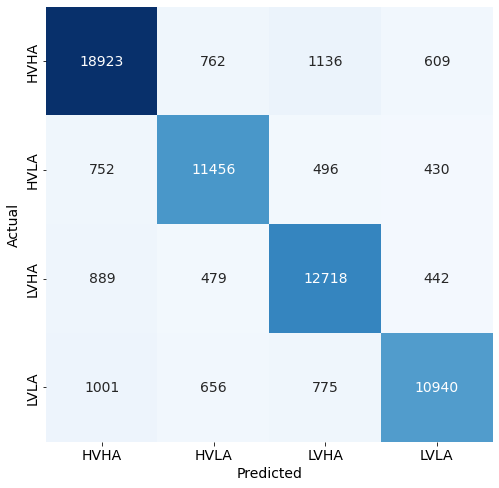

Classification Report:
----------------------
               precision    recall  f1-score   support

           0       0.88      0.88      0.88     21430
           1       0.86      0.87      0.87     13134
           2       0.84      0.88      0.86     14528
           3       0.88      0.82      0.85     13372

    accuracy                           0.87     62464
   macro avg       0.86      0.86      0.86     62464
weighted avg       0.87      0.87      0.86     62464



In [ ]:
class_names = ['HVHA', 'HVLA', 'LVHA', 'LVLA']

y_pred = model.predict(x_test)

y_predict = []

for i in range(len(y_pred)):
    y_predict.append(np.argmax(y_pred[i]))

y_predict = np.array(y_predict)
yt_test = np.argmax(y_test, axis=1)

cm = confusion_matrix(yt_test, y_predict)
clr = classification_report(yt_test, y_predict)

plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, vmin=0, fmt='g', cbar=False, cmap='Blues', annot_kws={"size":14})
plt.xticks(np.arange(4) + 0.5, class_names, fontsize=14)
plt.yticks(np.arange(4) + 0.5, class_names, fontsize=14)
plt.xlabel("Predicted", fontsize=14)
plt.ylabel("Actual", fontsize=14)
# plt.title("Confusion Matrix for LSTM Model")
plt.show()

print("Classification Report:\n----------------------\n", clr)

## CONV1D + GRU + Attention

In [ ]:
input_shape=(x_train.shape[1], 1)

In [ ]:
model_input = Input(shape=input_shape)

x = Conv1D(16, 3, activation='relu')(model_input)
x = MaxPooling1D(pool_size=2)(x)
x = Dropout(0.3)(x)

x = Conv1D(32, 3, activation='relu')(x)
x = MaxPooling1D(pool_size=2)(x)
x = Dropout(0.3)(x)

x = Conv1D(64, 3, activation='relu')(x)
x = MaxPooling1D(pool_size=2)(x)
x = Dropout(0.3)(x)

x = Conv1D(128, 3, activation='relu')(x)
x = MaxPooling1D(pool_size=2)(x)
x = Dropout(0.3)(x)

x = Bidirectional(GRU(256, return_sequences=True))(x)
x = Dropout(0.3)(x)

x = GRU(128, return_sequences=True)(x)
x = Dropout(0.3)(x)

x = GRU(64, return_sequences=True)(x)
x = Dropout(0.3)(x)

x = Attention(units=32)(x)

x = Dense(units = 16, activation='relu')(x)

output = Dense(4,activation="softmax")(x)

model = Model(model_input, output)
model.summary()

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=focal_loss(alpha=1), metrics=["accuracy"])

callbacks=[LRA(model=model,base_model=None,patience=patience,stop_patience=stop_patience, threshold=threshold,
                   factor=factor,dwell=dwell, batches=batches,initial_epoch=0,epochs=2, ask_epoch=ask_epoch )]

m=model.fit(X_train, y_train,epochs=2,batch_size=256,verbose=1,validation_data=(X_val, y_val),callbacks=callbacks)

Model: "model_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_22 (InputLayer)       [(None, 98, 1)]           0         
                                                                 
 conv1d_73 (Conv1D)          (None, 96, 16)            64        
                                                                 
 max_pooling1d_73 (MaxPoolin  (None, 48, 16)           0         
 g1D)                                                            
                                                                 
 dropout_121 (Dropout)       (None, 48, 16)            0         
                                                                 
 conv1d_74 (Conv1D)          (None, 46, 32)            1568      
                                                                 
 max_pooling1d_74 (MaxPoolin  (None, 23, 32)           0         
 g1D)                                                     

In [ ]:
score_1 = model.evaluate(x_test, y_test, verbose=1)
print('Test loss:', score_1[0])
print('Test accuracy:', score_1[1])

1952/1952 [==============================] - 24s 12ms/step - loss: 0.6208 - accuracy: 0.7545
Test loss: 0.6207813620567322
Test accuracy: 0.7544986009597778


In [ ]:
model.save('/content/drive/MyDrive/Main Akhand Sir UGRP/Models/gru_model.h5')

### Calculating accuracy and loss

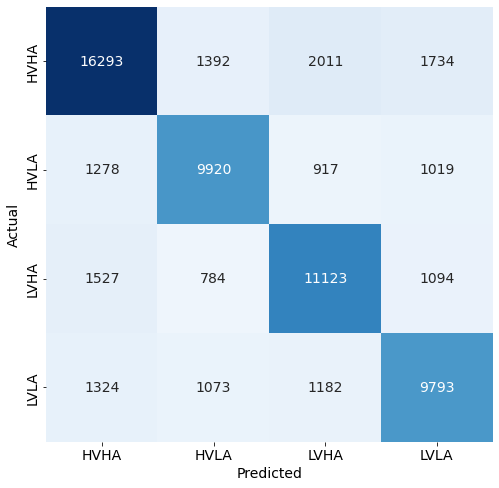

Classification Report:
----------------------
               precision    recall  f1-score   support

           0       0.80      0.76      0.78     21430
           1       0.75      0.76      0.75     13134
           2       0.73      0.77      0.75     14528
           3       0.72      0.73      0.73     13372

    accuracy                           0.75     62464
   macro avg       0.75      0.75      0.75     62464
weighted avg       0.76      0.75      0.75     62464



In [ ]:
class_names = ['HVHA', 'HVLA', 'LVHA', 'LVLA']

y_pred = model.predict(x_test)

y_predict = []

for i in range(len(y_pred)):
    y_predict.append(np.argmax(y_pred[i]))

y_predict = np.array(y_predict)
yt_test = np.argmax(y_test, axis=1)

cm = confusion_matrix(yt_test, y_predict)
clr = classification_report(yt_test, y_predict)

plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, vmin=0, fmt='g', cbar=False, cmap='Blues', annot_kws={"size":14})
plt.xticks(np.arange(4) + 0.5, class_names, fontsize=14)
plt.yticks(np.arange(4) + 0.5, class_names, fontsize=14)
plt.xlabel("Predicted", fontsize=14)
plt.ylabel("Actual", fontsize=14)
# plt.title("Confusion Matrix for LSTM Model")
plt.show()

print("Classification Report:\n----------------------\n", clr)

## ML Models

In [ ]:
automl.fit(X_train=x_train, y_train=label_train,X_val=x_val, y_val=label_val,**automl_settings)

[flaml.automl: 07-10 12:03:48] {2390} INFO - task = classification
[flaml.automl: 07-10 12:03:48] {2392} INFO - Data split method: stratified
[flaml.automl: 07-10 12:03:48] {2396} INFO - Evaluation method: holdout
[flaml.automl: 07-10 12:03:48] {2465} INFO - Minimizing error metric: 1-accuracy
[flaml.automl: 07-10 12:03:48] {2605} INFO - List of ML learners in AutoML Run: ['lgbm', 'rf', 'xgboost', 'extra_tree', 'xgb_limitdepth', 'lrl1']
[flaml.automl: 07-10 12:03:48] {2897} INFO - iteration 0, current learner lgbm
[flaml.automl: 07-10 12:03:49] {3026} INFO - Estimated sufficient time budget=307056s. Estimated necessary time budget=7078s.
[flaml.automl: 07-10 12:03:49] {3078} INFO -  at 0.9s,	estimator lgbm's best error=0.7082,	best estimator lgbm's best error=0.7082
[flaml.automl: 07-10 12:03:49] {2897} INFO - iteration 1, current learner lgbm
[flaml.automl: 07-10 12:03:49] {3078} INFO -  at 1.2s,	estimator lgbm's best error=0.7082,	best estimator lgbm's best error=0.7082
[flaml.automl

KeyboardInterrupt: ignored

In [ ]:
# Print the best model
print(automl.model.estimator)

In [ ]:
class_names = ['HVHA', 'HVLA', 'LVHA', 'LVLA']

y_pred = automl.predict_proba(x_test)

y_predict = []

for i in range(len(y_pred)):
    y_predict.append(np.argmax(y_pred[i]))

y_predict = np.array(y_predict)
yt_test = np.argmax(y_test, axis=1)

cm = confusion_matrix(yt_test, y_predict)
clr = classification_report(yt_test, y_predict)

plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, vmin=0, fmt='g', cbar=False, cmap='Blues', annot_kws={"size":14})
plt.xticks(np.arange(4) + 0.5, class_names, fontsize=14)
plt.yticks(np.arange(4) + 0.5, class_names, fontsize=14)
plt.xlabel("Predicted", fontsize=14)
plt.ylabel("Actual", fontsize=14)
# plt.title("Confusion Matrix for LSTM Model")
plt.show()

print("Classification Report:\n----------------------\n", clr)

# Explainable AI

## Config

In [ ]:
columns_x = [str(i) for i in range(1,71)]
columns_y = ['y']

In [ ]:
X_test_df = pd.DataFrame(data=x_test,columns=columns_x)
y_test_df = pd.DataFrame(data=label_test,columns=columns_y)
main_df = pd.concat([X_test_df, y_test_df], axis=1)

In [ ]:
X_test_df

,1,2,3,4,5,6,7,8,9,10,...,61,62,63,64,65,66,67,68,69,70
0,-0.617147,0.636378,0.587287,1.244163,-0.150749,-0.173022,1.221708,1.645270,1.582662,0.044055,...,0.134921,1.132597,1.822344,1.674978,0.209408,0.185419,1.746534,2.741320,2.000489,-0.003069
1,-0.241729,0.551209,0.792696,1.291462,-0.435471,-0.075021,0.674710,1.147402,1.491552,-0.110493,...,-0.148656,1.440445,1.346011,1.457885,0.091806,0.196794,1.672112,3.420799,1.854947,0.140093
2,-0.301760,0.878049,2.569385,0.745719,-0.528996,0.156580,1.044935,2.722882,0.931949,-0.190337,...,-0.188677,2.195080,0.305052,0.971211,0.075584,-0.081604,2.314534,2.575232,0.863620,-0.111339
3,-0.482297,0.323342,3.049202,1.823358,-0.508729,0.032134,1.126123,3.451716,1.921399,-0.350851,...,-0.398513,0.558366,1.395878,0.788939,0.326359,0.057407,0.916953,3.501188,1.372836,-0.161261
4,-0.354565,0.112923,0.537133,2.224054,-0.609594,-0.052285,0.567613,1.043852,2.616892,-0.354132,...,-0.264839,1.659875,1.453568,1.508610,0.251271,0.665935,1.766103,1.837328,2.384562,-0.288884
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62459,-0.676551,-0.726864,-0.373632,-0.028346,0.675517,-0.985336,-1.004114,-0.847338,-0.586298,-0.494166,...,-0.684503,-0.643971,-0.604862,-0.298652,0.002794,-0.829229,-0.684692,0.019012,-0.219279,-0.537309
62460,-0.624670,-0.733599,-0.327905,0.592212,0.608450,-0.853170,-0.944857,-0.688735,-0.272735,-0.607343,...,-0.581609,-0.742814,-0.581098,0.100938,0.143805,-0.388966,-0.252522,-0.031874,-0.189259,-0.546723
62461,0.044488,0.463870,0.166993,0.009602,0.025838,-0.608325,-0.672130,-0.283071,-0.700540,-0.810799,...,-0.327177,-0.009249,0.410401,0.062802,-0.439179,-0.130777,-0.034025,-0.162589,-0.538578,-0.617697
62462,0.707825,0.593506,0.142382,-0.035369,-0.044492,-0.368257,-0.580112,-0.569468,-0.824305,-0.873871,...,-0.497720,-0.446914,-0.349921,-0.386693,-0.432519,-0.809057,-0.918517,-0.407678,-0.603453,-0.817810


In [ ]:
zero_df=main_df.loc[main_df['y']==0]
one_df=main_df.loc[main_df['y']==1]
two_df=main_df.loc[main_df['y']==2]
three_df=main_df.loc[main_df['y']==3]

## LSTM

In [ ]:
model.load_weights('/content/drive/MyDrive/Main Akhand Sir UGRP/Models/lstm_model.h5')

In [ ]:
background_train = X_train[np.random.choice(X_train.shape[0],100, replace=False)]
background_test = X_test[np.random.choice(X_test.shape[0],100, replace=False)]

In [ ]:
exp_list = []

for i in range(len(np.unique(label_test))):
    # add i parameter to `predict_function` just to do it in a loop
    pf = lambda m, d, i=i: m.predict(d)[:, i]
    e = dx.Explainer(
        model, x_test, 
        label_test == i, 
        predict_function=pf,
        label=f'LSTM: class {i}',
        verbose=False
    )
    exp_list += [e]

exp_list

/usr/local/lib/python3.7/dist-packages/dalex/_explainer/yhat.py:28: UserWarning:

Tensorflow: Output shape of the predict method should not be greater than 2

/usr/local/lib/python3.7/dist-packages/dalex/_explainer/yhat.py:28: UserWarning:

Tensorflow: Output shape of the predict method should not be greater than 2

/usr/local/lib/python3.7/dist-packages/dalex/_explainer/yhat.py:28: UserWarning:

Tensorflow: Output shape of the predict method should not be greater than 2

/usr/local/lib/python3.7/dist-packages/dalex/_explainer/yhat.py:28: UserWarning:

Tensorflow: Output shape of the predict method should not be greater than 2



In [ ]:
# m_profile_list = [e.model_profile() for e in exp_list]

In [ ]:
# # plot multiple explanations
# m_profile_list[0].plot(m_profile_list[1:])

In [ ]:
m_parts_list = [e.model_parts() for e in exp_list]
m_parts_list[0].plot(m_parts_list[1:])